# Installing Detectron2

In [1]:
import torch
print(torch.__version__)

2.1.0+cu121


In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15297, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 15297 (delta 7), reused 7 (delta 1), pack-reused 15275
Receiving objects: 100% (15297/15297), 6.18 MiB | 10.64 MiB/s, done.
Resolving deltas: 100% (11118/11118), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.4 MB/s eta 0:00:00
  Pre

# Checking installation

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


# Importing Libraries

In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Make folders for images dataset

In [6]:
!unzip img.zip -d img

Archive:  img.zip
  inflating: img/img-1.jpg           
  inflating: img/img-10.jpg          
  inflating: img/img-100.jpg         
  inflating: img/img-101.jpg         
  inflating: img/img-102.jpg         
  inflating: img/img-103.jpg         
  inflating: img/img-104.jpg         
  inflating: img/img-105.jpg         
  inflating: img/img-106.jpg         
  inflating: img/img-107.jpg         
  inflating: img/img-108.jpg         
  inflating: img/img-109.jpg         
  inflating: img/img-11.jpg          
  inflating: img/img-110.jpg         
  inflating: img/img-111.jpg         
  inflating: img/img-112.jpg         
  inflating: img/img-113.jpg         
  inflating: img/img-114.jpg         
  inflating: img/img-115.jpg         
  inflating: img/img-116.jpg         
  inflating: img/img-117.jpg         
  inflating: img/img-118.jpg         
  inflating: img/img-119.jpg         
  inflating: img/img-12.jpg          
  inflating: img/img-120.jpg         
  inflating: img/img-121.jpg    

In [5]:
!unzip dataset.zip -d dataset

Archive:  dataset.zip
  inflating: dataset/img-1.xml       
  inflating: dataset/img-10.xml      
  inflating: dataset/img-100.xml     
  inflating: dataset/img-101.xml     
  inflating: dataset/img-102.xml     
  inflating: dataset/img-103.xml     
  inflating: dataset/img-104.xml     
  inflating: dataset/img-105.xml     
  inflating: dataset/img-106.xml     
  inflating: dataset/img-107.xml     
  inflating: dataset/img-108.xml     
  inflating: dataset/img-109.xml     
  inflating: dataset/img-11.xml      
  inflating: dataset/img-110.xml     
  inflating: dataset/img-111.xml     
  inflating: dataset/img-112.xml     
  inflating: dataset/img-113.xml     
  inflating: dataset/img-114.xml     
  inflating: dataset/img-115.xml     
  inflating: dataset/img-116.xml     
  inflating: dataset/img-117.xml     
  inflating: dataset/img-118.xml     
  inflating: dataset/img-119.xml     
  inflating: dataset/img-12.xml      
  inflating: dataset/img-120.xml     
  inflating: dataset/img-121

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("experiment", {}, "/content/output.json", "/content/img")

In [8]:
sample_metadata = MetadataCatalog.get("experiment")
dataset_dicts = DatasetCatalog.get("experiment")

WARNING [12/30 06:58:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/30 06:58:48 d2.data.datasets.coco]: Loaded 665 images in COCO format from /content/output.json


# Vizualize Annotations

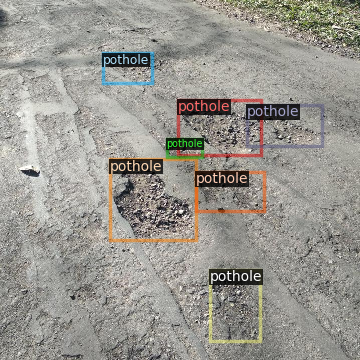

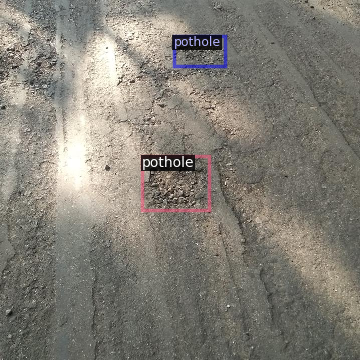

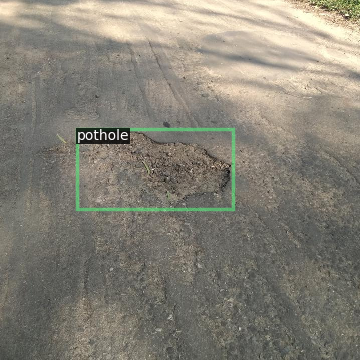

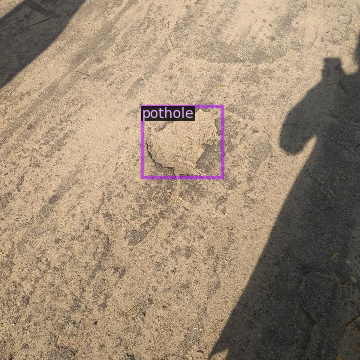

In [9]:
import random

for d in random.sample(dataset_dicts, 4):
    img = cv2.imread(d["file_name"])
    if img is not None:
        visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        cv2_imshow(vis.get_image()[:, :, ::-1])

In [10]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 15297, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 15297 (delta 7), reused 7 (delta 1), pack-reused 15275
Receiving objects: 100% (15297/15297), 6.18 MiB | 11.72 MiB/s, done.
Resolving deltas: 100% (11121/11121), done.


# Training Detectron2

In [11]:

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("experiment",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")# initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 200   # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 3 classes (Person, Helmet, Car)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[12/30 06:58:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 103MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[12/30 06:58:54 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/30 06:59:06 d2.utils.events]:  eta: 0:01:10  iter: 19  total_loss: 1.028  loss_cls: 0.4026  loss_box_reg: 0.4419  loss_rpn_cls: 0.07336  loss_rpn_loc: 0.02024    time: 0.3721  last_time: 0.4017  data_time: 0.0218  last_data_time: 0.0337   lr: 0.0019181  max_mem: 2635M
[12/30 06:59:17 d2.utils.events]:  eta: 0:01:01  iter: 39  total_loss: 0.832  loss_cls: 0.2755  loss_box_reg: 0.5288  loss_rpn_cls: 0.03288  loss_rpn_loc: 0.01214    time: 0.3770  last_time: 0.4183  data_time: 0.0148  last_data_time: 0.0013   lr: 0.0039161  max_mem: 2635M
[12/30 06:59:24 d2.utils.events]:  eta: 0:00:54  iter: 59  total_loss: 0.6536  loss_cls: 0.2541  loss_box_reg: 0.3065  loss_rpn_cls: 0.05106  loss_rpn_loc: 0.01902    time: 0.3761  last_time: 0.4968  data_time: 0.0119  last_data_time: 0.0107   lr: 0.0059141  max_mem: 2635M
[12/30 06:59:32 d2.utils.events]:  eta: 0:00:47  iter: 79  total_loss: 0.7462  loss_cls: 0.2465  loss_box_reg: 0.397  loss_rpn_cls: 0.05066  loss_rpn_loc: 0.02102    time: 0.3821  

In [12]:

from detectron2.data import detection_utils

class CustomDatasetMapper:
    def __init__(self, cfg, is_train=True):
        self.tfm_gens = detection_utils.build_transform_gen(cfg, is_train)

    def __call__(self, dataset_dict):
        dataset_dict = copy.deepcopy(dataset_dict)
        try:
            image = utils.read_image(dataset_dict["file_name"], format="BGR")
            transform_list = self.tfm_gens.get_transform(image)
            image, transforms = transform_list.apply_image(image)
        except FileNotFoundError:
            return None

        dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))
        if "annotations" in dataset_dict:
            annos = [detection_utils.transform_instance_annotations(obj, transforms, image.shape[:2])
                     for obj in dataset_dict.pop("annotations") if obj.get("iscrowd", 0) == 0]
            dataset_dict["instances"] = utils.annotations_to_instances(annos, image.shape[:2])
        return dataset_dict

# Use the custom dataset mapper in the trainer
cfg.DATASETS.TRAIN = ("experiment",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 200
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[12/30 07:00:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[12/30 07:00:21 d2.engine.train_loop]: Starting training from iteration 0
[12/30 07:00:29 d2.utils.events]:  eta: 0:01:11  iter: 19  total_loss: 0.8562  loss_cls: 0.4055  loss_box_reg: 0.3667  loss_rpn_cls: 0.0675  loss_rpn_loc: 0.01923    time: 0.3864  last_time: 0.3965  data_time: 0.0315  last_data_time: 0.0131   lr: 0.0019181  max_mem: 2636M
[12/30 07:00:37 d2.utils.events]:  eta: 0:01:02  iter: 39  total_loss: 0.839  loss_cls: 0.3398  loss_box_reg: 0.5096  loss_rpn_cls: 0.04067  loss_rpn_loc: 0.01087    time: 0.3870  last_time: 0.4385  data_time: 0.0141  last_data_time: 0.0096   lr: 0.0039161  max_mem: 2636M
[12/30 07:00:45 d2.utils.events]:  eta: 0:00:55  iter: 59  total_loss: 0.7092  loss_cls: 0.2277  loss_box_reg: 0.3182  loss_rpn_cls: 0.08599  loss_rpn_loc: 0.02004    time: 0.3874  last_time: 0.3278  data_time: 0.0103  last_data_time: 0.0095   lr: 0.0059141  max_mem: 2636M
[12/30 07:00:53 d2.utils.events]:  eta: 0:00:48  iter: 79  total_loss: 0.6475  loss_cls: 0.2123  loss_box_

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Create a COCO Evaluator
evaluator = COCOEvaluator("experiment", cfg, False, output_dir="./output/")

# Perform inference on the test dataset
test_loader = build_detection_test_loader(cfg, "experiment")
inference_on_dataset(trainer.model, test_loader, evaluator)

# Print the evaluation results
print(evaluator.evaluate())


[12/30 07:01:42 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [12/30 07:01:42 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [12/30 07:01:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/30 07:01:42 d2.data.datasets.coco]: Loaded 665 images in COCO format from /content/output.json
[12/30 07:01:42 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/30 07:01:42 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/30 07:01:42 d2.data.common]: Serializing 665 elements to byte tensors and concatenating them all ...
[12/30 07:01:42 d2.data.common]: Serialized dataset takes 0.17 MiB
[12/30 07:0

TypeError: ignored

In [15]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Create a COCO Evaluator
evaluator = COCOEvaluator("experiment", cfg, False, output_dir="./output/")

# Perform inference on the test dataset
test_loader = build_detection_test_loader(cfg, "experiment")
results = inference_on_dataset(trainer.model, test_loader, evaluator)

# Extract the metrics
metrics = results["bbox"]

# Print the metrics
print(f"Mean Average Precision (mAP): {metrics['AP']}")
print(f"AP50: {metrics['AP50']}")
print(f"AP75: {metrics['AP75']}")
print(f"APs: {metrics['APs']}")
print(f"APm: {metrics['APm']}")
print(f"APl: {metrics['APl']}")

[12/30 07:06:25 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [12/30 07:06:25 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [12/30 07:06:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/30 07:06:25 d2.data.datasets.coco]: Loaded 665 images in COCO format from /content/output.json
[12/30 07:06:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/30 07:06:25 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/30 07:06:25 d2.data.common]: Serializing 665 elements to byte tensors and concatenating them all ...
[12/30 07:06:25 d2.data.common]: Serialized dataset takes 0.17 MiB
[12/30 07:0

In [18]:
metrics = evaluator._results

# Calculate mAP in percentage
mAP_percentage = metrics["bbox"]["AP"]
print(f"Mean Average Precision (mAP): {mAP_percentage:.2f}%")

Mean Average Precision (mAP): 9.76%


In [16]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Saving cfg

In [17]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("experiment",)
predictor = DefaultPredictor(cfg)

[12/30 07:07:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# Vizualizing for testing Model

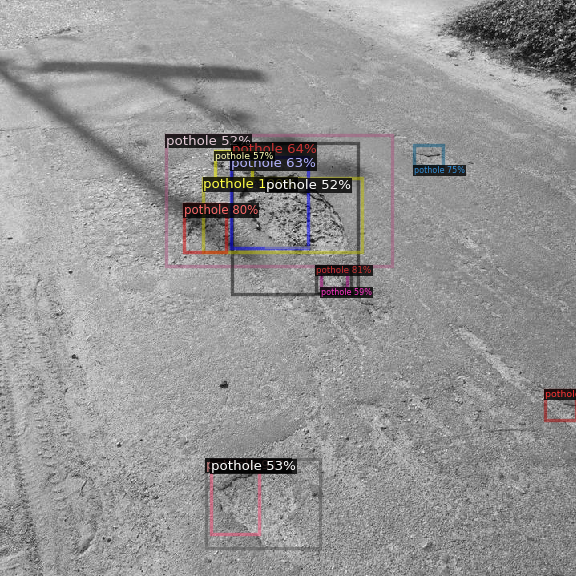

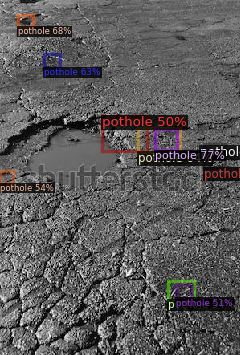

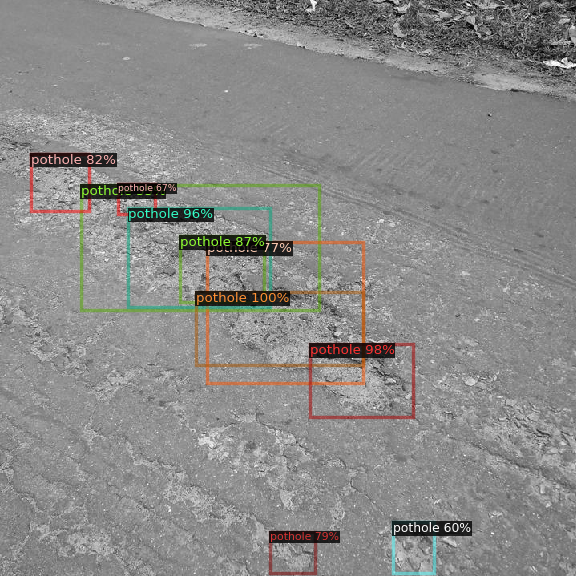

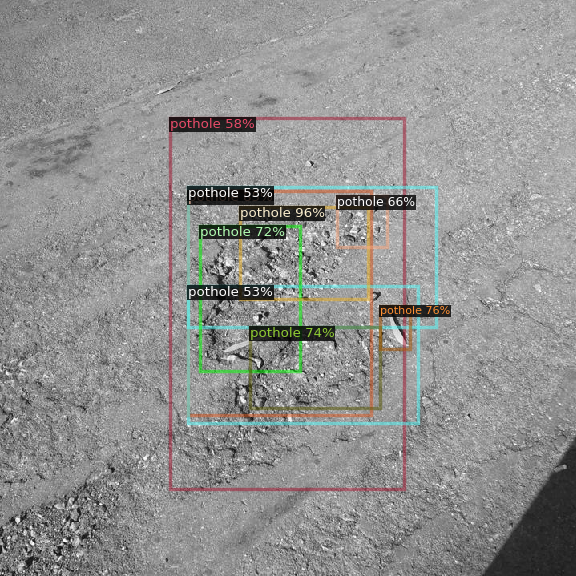

In [19]:

from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 4):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

# Save model in yaml format

In [20]:
f= open("config1.yaml","w")
f.write(cfg.dump())
f.close()